# Spatially-Varying Filtering on OISST (gcm-filters)

This notebook pre-processes the observational SST data by applying a spatially-varying length smoothing filter via gcm-filters. It creates and saves dataset smoothed with the spatially-varying length filter scale. The notebook then opens and plots the saved SST dataset.

*Note: Used a cloned NPL 2025a environment with gcm-filters installed.*

## Import Libraries

In [1]:
import sys
print(sys.executable)

/glade/u/home/anyalee/.conda/envs/gcm-filters-env/bin/python


In [2]:
# Import libraries
import cartopy.crs as ccrs
import dask.array as da
from dask.distributed import LocalCluster, Client
import gcm_filters
import glob
import hvplot.xarray
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import warnings
import xarray as xr
import xesmf as xe
warnings.filterwarnings('ignore')
xr.set_options(display_expand_data=False);

## Load the Data

In [3]:
cluster = LocalCluster()
client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/anyalee/proxy/8787/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/anyalee/proxy/8787/status,Workers: 6
Total threads: 36,Total memory: 384.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42199,Workers: 6
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/anyalee/proxy/8787/status,Total threads: 36
Started: Just now,Total memory: 384.00 GiB
Comm: tcp://127.0.0.1:35357,Total threads: 6
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/anyalee/proxy/38199/status,Memory: 64.00 GiB
Nanny: tcp://127.0.0.1:38185,


In [4]:
# Read in data

# Get list of .nc files, excluding "preliminary" ones
file_list = glob.glob('/glade/campaign/univ/ucub0175/OISST/*.nc')
file_list = [file_name for file_name in file_list if "preliminary" not in file_name]

# files in list are not in order by date
print(f"Path of first file in file_list: {file_list[0]}")

file_list_sorted = sorted(file_list)
print(f"Path of first file in sorted file_list: {file_list_sorted[0]}")

print(f"Found {len(file_list)} files")
# 15979 files without preliminary
# 15993 total files

Path of first file in file_list: /glade/campaign/univ/ucub0175/OISST/oisst-avhrr-v02r01.19911020.nc
Path of first file in sorted file_list: /glade/campaign/univ/ucub0175/OISST/oisst-avhrr-v02r01.19810901.nc
Found 15979 files


In [5]:
%%time
# Create SST xarray.Dataset (dask when specify chunks)
ds_sst = xr.open_mfdataset(
    file_list_sorted,
    concat_dim='time',
    combine='nested',
    parallel=True,           # use dask to load in parallel
    preprocess=lambda ds: ds[['sst']],  # only keep SST variable
    chunks={'lat': 120, 'lon': 240},
    engine='netcdf4'
)

/glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/dask/utils.py:77: UserWarning: The specified chunks separate the stored chunks along dimension "lat" starting at index 120. This could degrade performance. Instead, consider rechunking after loading.
  return func(*args, **kwargs)
/glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/dask/utils.py:77: UserWarning: The specified chunks separate the stored chunks along dimension "lon" starting at index 240. This could degrade performance. Instead, consider rechunking after loading.
  return func(*args, **kwargs)
/glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-packages/dask/utils.py:77: UserWarning: The specified chunks separate the stored chunks along dimension "lat" starting at index 120. This could degrade performance. Instead, consider rechunking after loading.
  return func(*args, **kwargs)
/glade/u/home/anyalee/.conda/envs/gcm-filters-env/lib/python3.12/site-

CPU times: user 51.6 s, sys: 3.3 s, total: 54.9 s
Wall time: 1min 14s


In [6]:
# Check time range
print(ds_sst['time'].values[0], ds_sst['time'].values[-1])
# 1981-09-01 to 2025-06-01

1981-09-01T12:00:00.000000000 2025-06-01T12:00:00.000000000


In [7]:
ds_sst = ds_sst.squeeze('zlev')
ds_sst

<xarray.Dataset> Size: 66GB
Dimensions:  (time: 15979, lat: 720, lon: 1440)
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * time     (time) datetime64[ns] 128kB 1981-09-01T12:00:00 ... 2025-06-01T1...
    zlev     float32 4B 0.0
Data variables:
    sst      (time, lat, lon) float32 66GB dask.array<chunksize=(1, 120, 240), meta=np.ndarray>
Attributes: (12/37)
    title:                      NOAA/NCEI 1/4 Degree Daily Optimum Interpolat...
    source:                     ICOADS, NCEP_GTS, GSFC_ICE, NCEP_ICE, Pathfin...
    id:                         oisst-avhrr-v02r01.19810901.nc
    naming_authority:           gov.noaa.ncei
    summary:                    NOAAs 1/4-degree Daily Optimum Interpolation ...
    cdm_data_type:              Grid
    ...                         ...
    metadata_link:              https://doi.org/10.25921/RE9P-PT57
    ncei_template_version:      NCEI_NetCDF_Grid_Template_v2.0
    comment:                    Data was converted from NetCDF-3 to NetCDF-4 ...
    sensor:                     Thermometer, AVHRR
    Conventions:                CF-1.6, ACDD-1.3
    references:                 Reynolds, et al.(2007) Daily High-Resolution-...

In [8]:
print(ds_sst)

<xarray.Dataset> Size: 66GB
Dimensions:  (time: 15979, lat: 720, lon: 1440)
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * time     (time) datetime64[ns] 128kB 1981-09-01T12:00:00 ... 2025-06-01T1...
    zlev     float32 4B 0.0
Data variables:
    sst      (time, lat, lon) float32 66GB dask.array<chunksize=(1, 120, 240), meta=np.ndarray>
Attributes: (12/37)
    title:                      NOAA/NCEI 1/4 Degree Daily Optimum Interpolat...
    source:                     ICOADS, NCEP_GTS, GSFC_ICE, NCEP_ICE, Pathfin...
    id:                         oisst-avhrr-v02r01.19810901.nc
    naming_authority:           gov.noaa.ncei
    summary:                    NOAAs 1/4-degree Daily Optimum Interpolation ...
    cdm_data_type:              Grid
    ...                         ...
    metadata_link:              https://doi.org/10.25921/RE9P-PT57
    ncei_template_ve

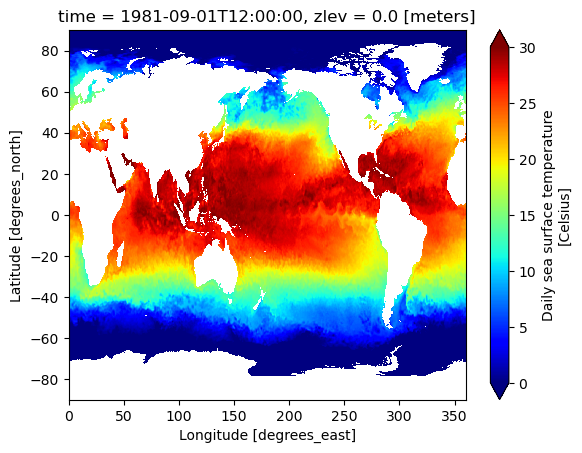

In [11]:
ds_sst.sst.isel(time=0).plot(vmin=0,vmax=30,cmap='jet'); plt.show()

## Spatial Smoothing Filter

Now let's apply the Gaussian filter using the gcm-filters package. First carryout some preliminary steps below.

In [12]:
# Replace fill values (-999s) with NaN
# for wet mask bellow
ds_sst['sst'] = ds_sst['sst'].where(ds_sst['sst'] != -999, np.nan)

# Convert to dask array; required for gcm_filters
# Rechunks so that lat and lon are each in a single chunk
ds_sst = ds_sst.chunk({"lat": -1, "lon": -1})

In [13]:
gcm_filters.required_grid_vars(gcm_filters.GridType.IRREGULAR_WITH_LAND)

['wet_mask', 'dxw', 'dyw', 'dxs', 'dys', 'area', 'kappa_w', 'kappa_s']

### Interpolate T-cell area from 2/3-degree MOM6 grid to the 1/4-degree OISST grid and then take the square root

We interpolate in order to find the filter length scale.

In [14]:
#-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-
#+-+-+-+- plot a given dataarray on a given axis object +-+-+-+-
#-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-+-
def plot_map(ax, da, vmin=-999, vmax=999, units='units',
             lon='geolon', lat='geolat', cmap='RdBu_r', 
             extent=None, orientation='horizontal', 
             title='My Plot', add_colorbar=True):

    p = da.plot(ax=ax, x=lon, y=lat, vmin=vmin, vmax=vmax, 
                cmap=cmap, transform=ccrs.PlateCarree(), 
                add_labels=False, add_colorbar=False)

    # draw coastlines
    #p.axes.coastlines(linewidth=0.5)

    # add separate colorbar
    if add_colorbar:
        cb = plt.colorbar(p, ax=ax, label=units, extend='both', 
                          orientation=orientation, shrink=0.9)

        cb.ax.tick_params(labelsize=12)
        cb.ax.set_ylabel(units, rotation=270)
    
    # add gridlines
    p.axes.gridlines(color='black', alpha=0.5, linestyle='--')
    
    # set the axis extent based on the area of interest and
    # the reference coordinate system for interpreting the extent.
    if extent is not None:
        p.axes.set_extent(extent, ccrs.PlateCarree())
    
    ax.set_title(title, fontsize=14)
    return p

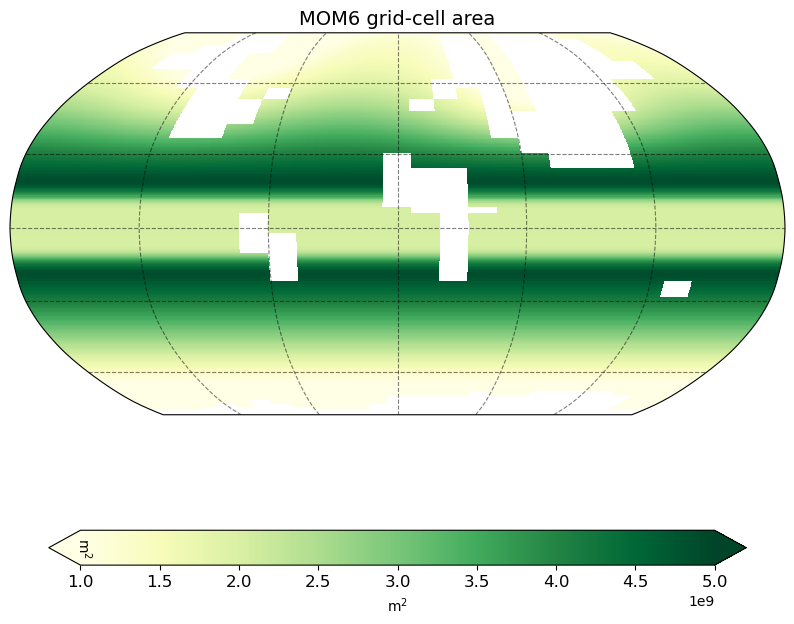

In [15]:
# Get the MOM6 T-cell area
loc = '/glade/derecho/scratch/igrooms/archive/g.e30_b06.GJRAv4.TL319_t232_wgx3_hycom1_N75.2025.087/ocn/hist/'
static_file = loc + 'g.e30_b06.GJRAv4.TL319_t232_wgx3_hycom1_N75.2025.087.mom6.h.static.nc'
ds_static = xr.open_dataset(static_file)

tcell_area_mom6 = ds_static['areacello']  # equivalent to area_t in MOM6 outputs

# load in the geolat and geolon coordinates from static file
# assigns geolat and geolon coords to ds_sst
lon_t = ds_static['geolon']
lat_t = ds_static['geolat']

tcell_area_mom6 = tcell_area_mom6.assign_coords({
    'lon': (('yh', 'xh'), lon_t.data),
    'lat': (('yh', 'xh'), lat_t.data)
})

# Grid spacing from OISST
lat_out = ds_sst['lat']
lon_out = ds_sst['lon']

ds_out = xr.Dataset({
    'lat': (['lat'], lat_out.data),  # lats from OISST
    'lon': (['lon'], lon_out.data)   # lons from OISST
})

ds_in = xr.Dataset({
    'lat': (('y', 'x'), ds_static['geolat'].data),
    'lon': (('y', 'x'), ds_static['geolon'].data)
})

# Build regridder, bilinear
regridder_bi = xe.Regridder(ds_in, ds_out, method='bilinear', periodic=True)

# Interpolate area_mom6 on the SST OBS grid using regridder
tcell_area_mom6_on_OBS_grid = regridder_bi(tcell_area_mom6)

# plot MOM6 T-cell area
#tcell_area_mom6.hvplot.quadmesh('xh','yh',projection=ccrs.Robinson(), 
#                          global_extent=True, cmap='YlGn', coastline=True)
f, ax = plt.subplots(1,1, figsize=(10,10),subplot_kw={'projection':ccrs.Robinson()})
_ = plot_map(ax, tcell_area_mom6, vmin=1e9, vmax=5e9, units=r'm$^2$',
             lon='xh', lat='yh', cmap='YlGn', title='MOM6 grid-cell area')
plt.show()

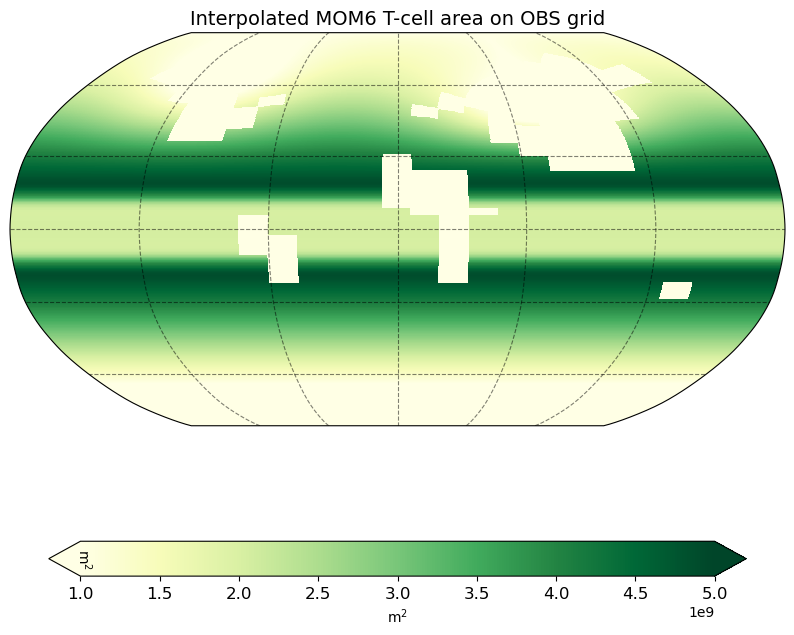

In [19]:
# Plot of interpolatation of area_mom6 on the SST OBS grid 
f, ax = plt.subplots(1,1, figsize=(10,10),subplot_kw={'projection':ccrs.Robinson()})
_ = plot_map(ax, tcell_area_mom6_on_OBS_grid, vmin=1e9, vmax=5e9, units=r'm$^2$',
             lon='lon', lat='lat', cmap='YlGn', title='Interpolated MOM6 T-cell area on OBS grid')
plt.show()

In [20]:
tcell_area_mom6

<xarray.DataArray 'areacello' (yh: 480, xh: 540)> Size: 1MB
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [14989963. , 48527332. , 81321656. , ..., 81321656. , 48527332. ,
        14989963. ],
       [10637394. , 44391384. , 77684952. , ..., 77684952. , 44391384. ,
        10637394. ],
       [ 4974001.5, 39862780. , 73849736. , ..., 73849736. , 39862780. ,
         4974001.5]], dtype=float32)
Coordinates:
  * xh       (xh) float64 4kB -286.7 -286.0 -285.3 -284.7 ... 71.33 72.0 72.67
  * yh       (yh) float64 4kB -81.56 -81.46 -81.36 -81.26 ... 87.65 87.71 87.74
    lon      (yh, xh) float32 1MB nan nan nan nan nan ... 72.97 72.97 72.98 73.0
    lat      (yh, xh) float32 1MB nan nan nan nan ... 50.46 50.27 50.11 49.99
Attributes:
    units:          m2
    long_name:      Ocean Grid-Cell Area
    cell_methods:   area:sum yh:sum xh:sum time: point
    standard_name:  cell_area

In [21]:
# compute the filtering length scale 
filter_length_scale = np.sqrt(tcell_area_mom6_on_OBS_grid)
filter_length_scale

<xarray.DataArray (lat: 720, lon: 1440)> Size: 4MB
0.0 0.0 0.0 0.0 0.0 0.0 ... 3.039e+04 3.038e+04 3.037e+04 3.037e+04 3.036e+04
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
Attributes:
    regrid_method:  bilinear

### Compute other filter variables below

Below we compute the cell area, get a wet mask, get grid variables: dxw, dyw, dxs, dys, get the filter scale using $L_{max}$ and compute kappa using the filter length scale calculated above and $L_{max}$. 

We take all these variables and put them into a grid variable dictionary. Then we create our filter using gcm-filters.

In [22]:
# Compute cell area
# for each lat/lon grid box gcm-filters needs area in same format as du,dv
# compute dx and dy in km
# For latitude: 90 degrees = 10000 Km (North Pole to Equator); 1 lat minute (nautical mile) = 1.852 Km
# For longitude: Same as above, but multiply the result by cos(latitude) as longitude lines converge at North pole

# Note: dy0 is a constant over the globe
dy0_sst = 1852*60*np.abs(ds_sst['lat'][2].data - ds_sst['lat'][1].data) # in km
dx0_sst = 1852*60*np.cos(np.deg2rad(ds_sst['lat'].data))*(ds_sst['lon'][2].data - ds_sst['lon'][1].data) 

area = dy0_sst*np.tile(dx0_sst, (len(ds_sst['lon'].data),1))
area = np.transpose(area)

# wrap in dataArray
dA_sst = xr.DataArray(
    data=area,
    dims=("lat", "lon"),
    coords={"lon":ds_sst['lon'].data, "lat":ds_sst['lat'].data}
)

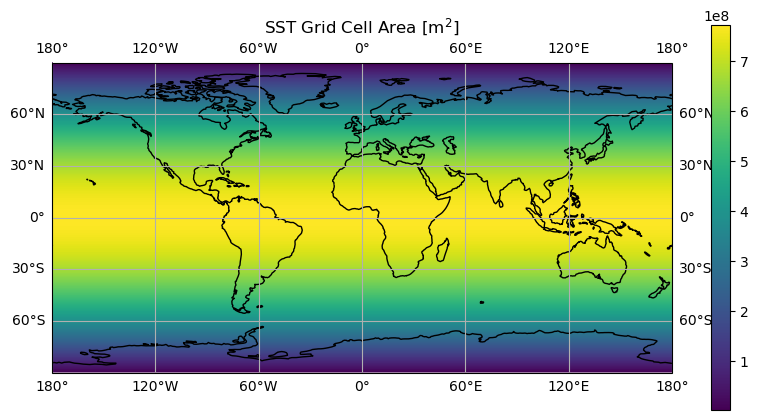

In [23]:
area_cmap = 'viridis'  # colormap

fig, ax = plt.subplots(
    1, 1,
    figsize=(10, 5),
    subplot_kw={'projection': ccrs.PlateCarree()}
)

dA_sst.plot(ax=ax, cmap=area_cmap)
ax.set_title('SST Grid Cell Area [m$^2$]')
ax.coastlines()

gl = ax.gridlines(draw_labels=True)
gl.xlabels_top = False
gl.ylabels_right = False

plt.show()

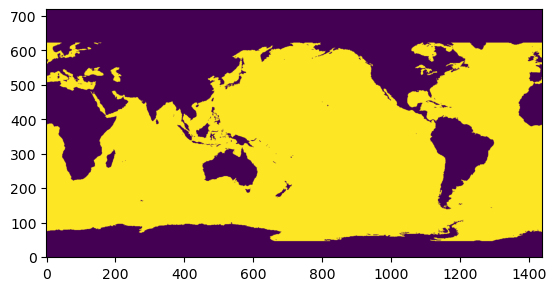

In [24]:
# Wet mask: land = 0, water = 1
sst_mask = xr.where(np.isnan(ds_sst['sst'].isel(time=0)), 0, 1)
highlats_mask = xr.where((ds_sst['lat'] >= 65) , 0, 1)
# didn't include "| (ds_lhf['latitude'] <= -70)" in highlats mask

wet_mask = sst_mask & highlats_mask
plt.imshow(wet_mask, origin='lower')
plt.show()

In [25]:
# Grid variable: dxw, dyw, dxs, dys
# dxw, dyw, dxs, dys
# only computed for SST as LHF grid is the same
latc = ds_sst['lat'].values
lonc = ds_sst['lon'].values
xc, yc = np.meshgrid(lonc,latc, indexing='xy') # grid cell centre coords

# dys
temp = yc - np.roll(yc, 1, axis=0); temp[0,:] = temp[0,:] + 180 
dys_a = 1852*60*temp
dys = xr.DataArray(
    data=dys_a, 
    coords={"lat":ds_sst['lat'], "lon":ds_sst['lon']},
    dims=["lat","lon"]
)

# dxw
temp = xc - np.roll(xc,1,axis=1); temp[:,0] = temp[:,0] + 360
dxw_a = 1852*60*np.cos(np.deg2rad(yc))*temp
dxw = xr.DataArray(
    data=dxw_a, 
    coords={"lat":ds_sst['lat'], "lon":ds_sst['lon']},
    dims=["lat", "lon"]
)

# for dxs and dyw, compute the cell vertices
late = [(latc[i]+latc[i+1])/2 for i in range(len(latc)-1)]
late.insert(len(late),90); late.insert(0,-90)
late = np.asarray(late);

lone = [(lonc[i]+lonc[i+1])/2 for i in range(len(lonc)-1)]
lone.insert(len(lone),360); lone.insert(0,0)
lone = np.asarray(lone)

xe, ye = np.meshgrid(lone, late, indexing='xy')

# dyw
dyw_a = 1852*60*np.diff(ye[:,:-1], axis=0)
dyw = xr.DataArray(
    data=dyw_a,
    coords={"lat":ds_sst['lat'], "lon":ds_sst['lon']},
    dims=["lat", "lon"]
)

# dxs
dxs_a = 1852*60*np.cos(np.deg2rad(ye[1:,:-1]))*np.diff(xe[1:,:],axis=1)
dxs = xr.DataArray(
    data=dxs_a, 
    coords={"lat":ds_sst['lat'], "lon":ds_sst['lon']},
    dims=["lat", "lon"]
)

In [27]:
# set filter_scale to the maximum length scale
L_max = filter_length_scale.max(dim=['lat','lon']).values
print('Maximum length scale:', L_max)
filter_scale = L_max  # 69845.266

Maximum length scale: 69845.266


In [28]:
# Finally set kappa_w and kappa_s
# here we set them to 1 as we don't vary the filter size spatially
# kappa_w = xr.ones_like(dxw)
# kappa_s = xr.ones_like(dxw)

# spatially-varying filter
kappa = (filter_length_scale / L_max) ** 2
kappa

<xarray.DataArray (lat: 720, lon: 1440)> Size: 4MB
0.0 0.0 0.0 0.0 0.0 0.0 0.0 ... 0.1895 0.1894 0.1893 0.1892 0.1891 0.189 0.1889
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9

In [29]:
# Create grid variable dict
grid_vars = {
    'wet_mask': wet_mask,
    'dxw': dxw,
    'dyw': dyw,
    'dxs': dxs,
    'dys': dys,
    'area': dA_sst,
    'kappa_w': kappa,
    'kappa_s': kappa
}

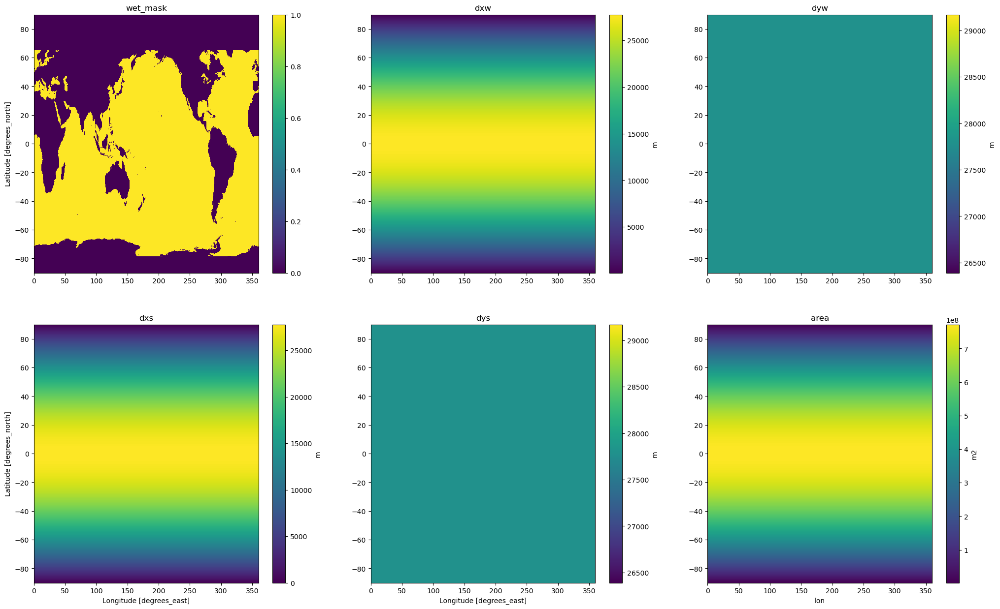

In [32]:
# plot a summary of the filtering inputs
fig,axs = plt.subplots(2,3,figsize=(25,15))
wet_mask.plot(ax=axs[0,0], cbar_kwargs={'label': ''})
axs[0,0].set(title='wet_mask', xlabel='')
dxw.plot(ax=axs[0,1], cbar_kwargs={'label': 'm'})
axs[0,1].set(title='dxw', xlabel='', ylabel='')
dyw.plot(ax=axs[0,2], cbar_kwargs={'label': 'm'})
axs[0,2].set(title='dyw', xlabel='', ylabel='')
dxs.plot(ax=axs[1,0], cbar_kwargs={'label': 'm'})
axs[1,0].set(title='dxs')
dys.plot(ax=axs[1,1], cbar_kwargs={'label': 'm'})
axs[1,1].set(title='dys', ylabel='')
dA_sst.plot(ax=axs[1,2], cbar_kwargs={'label': 'm2'})
axs[1,2].set(title='area', ylabel='');

plt.show()

In [30]:
# dx_min
dx_min_ = min(dxw.where(wet_mask).min().values, dyw.where(wet_mask).min().values,
              dxs.where(wet_mask).min().values, dys.where(wet_mask).min().values)
print(dx_min_)  # 5597.817741930485

5597.817741930485


In [31]:
# Create filter
filter = gcm_filters.Filter(
        filter_scale=L_max,         # meters
        dx_min=dx_min_,             # meters
        filter_shape=gcm_filters.FilterShape.GAUSSIAN,  # Gaussian
        grid_type=gcm_filters.GridType.IRREGULAR_WITH_LAND,  # needs wet_mask
        grid_vars=grid_vars
)

filter

Filter(filter_scale=array(69845.266, dtype=float32), dx_min=array(5597.81774193), filter_shape=<FilterShape.GAUSSIAN: 1>, transition_width=3.141592653589793, ndim=2, n_steps=14, grid_type=<GridType.IRREGULAR_WITH_LAND: 5>)

### Plots to confirm filter usage and variables

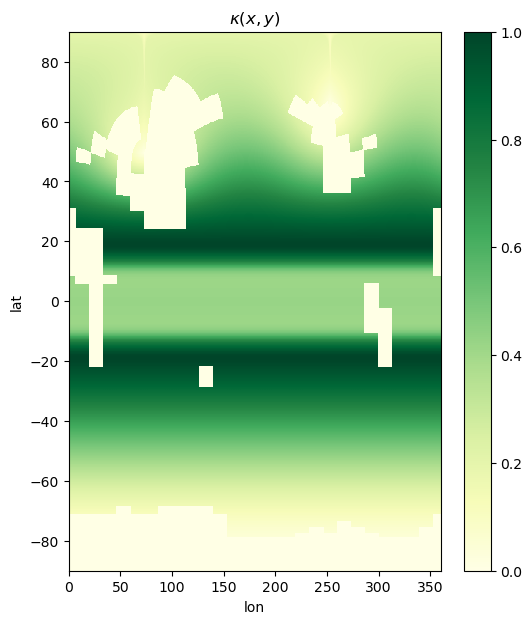

In [33]:
# plot kappa
fig,ax = plt.subplots(1,1,figsize=(6,7))
kappa.plot(ax=ax, vmin=0, cmap='YlGn', cbar_kwargs={'label': ''})
ax.set(title=r'$\kappa(x,y)$');
plt.show()

In [34]:
# Test at specific point
sst_full = ds_sst['sst'].isel(time=0)
sst_filtered = filter.apply(sst_full, dims=['lat','lon'])
sst_full

<xarray.DataArray 'sst' (lat: 720, lon: 1440)> Size: 4MB
dask.array<chunksize=(720, 1440), meta=np.ndarray>
Coordinates:
  * lat      (lat) float32 3kB -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 6kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
    time     datetime64[ns] 8B 1981-09-01T12:00:00
    zlev     float32 4B 0.0
Attributes:
    long_name:  Daily sea surface temperature
    units:      Celsius
    valid_min:  -300
    valid_max:  4500

In [35]:
# plot a given dataarray on a given axis object
def plot_map(ax, da, vmin=-999, vmax=999, units='units',
             lon='geolon', lat='geolat', cmap='RdBu_r', title='My Plot'):
    
    p = da.plot(ax=ax, x=lon, y=lat, vmin=vmin, vmax=vmax, cmap=cmap, 
                transform=ccrs.PlateCarree(), add_labels=False, add_colorbar=False)
    
    # add separate colorbar
    cb = plt.colorbar(p, ax=ax, extend='both', orientation="vertical", shrink=0.9)
    cb.ax.tick_params(labelsize=12)
    cb.ax.set_ylabel(units, rotation=270)
    
    # add gridlines
    p.axes.gridlines(color='black', alpha=0.5, linestyle='--')
    
    # set the axis extent based on the area of interest and the reference 
    # coordinate system for interpreting the extent. Comment this if global 
    # map is desired.
    #p.axes.set_extent([-300, 60, 75, 90], ccrs.PlateCarree())
    
    _ = plt.title(title, fontsize=14)
    return fig

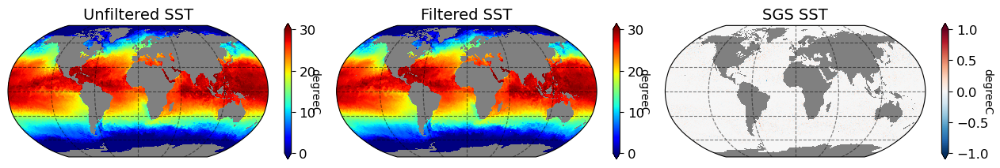

In [36]:
# plot SST
fig = plt.figure(figsize=[16,5])

# define the grid 
grid_ = plt.GridSpec(2, 3, wspace=0.01, hspace=0.01)

# subplot keyword arguments
subplot_kws=dict(projection=ccrs.Robinson(),facecolor='grey')

################ SST ################
# define the colorbar limits and the unit
cb_min = 0; cb_max = 30
units = 'degreeC'

# Unfiltered SST
ax = fig.add_subplot(grid_[0, 0], **subplot_kws)
_ = plot_map(ax, sst_full, vmin=cb_min, vmax=cb_max, 
             units=units, lon='lon', lat='lat', cmap='jet', 
             title=r'Unfiltered SST')
# Filtered SST
ax = fig.add_subplot(grid_[0, 1], **subplot_kws)
_ = plot_map(ax, sst_filtered, vmin=cb_min, vmax=cb_max, units=units, 
             lon='lon', lat='lat', cmap='jet', 
             title=r'Filtered SST')
# SGS SST
cb_min = -1; cb_max = 1
ax = fig.add_subplot(grid_[0, 2], **subplot_kws)
_ = plot_map(ax, sst_full - sst_filtered, vmin=cb_min, vmax=cb_max, 
             units=units, lon='lon', lat='lat', cmap='RdBu_r', 
             title=r'SGS SST')

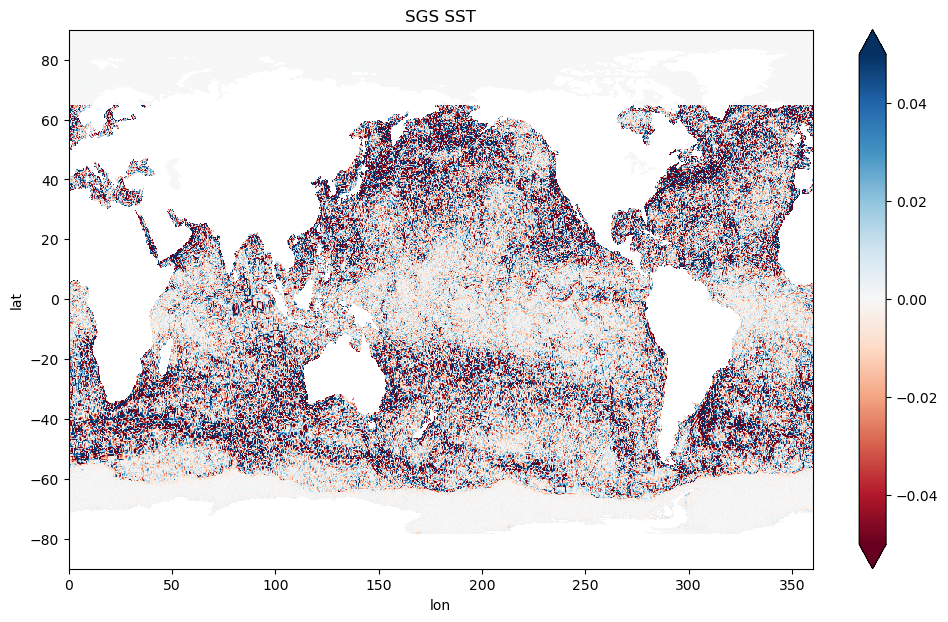

In [37]:
# plot SGS SST
sgs_sst = sst_full - sst_filtered

fig,ax = plt.subplots(1,1,figsize=(12,7))
sgs_sst.plot(ax=ax, vmin=-0.05, vmax=0.05, cmap='RdBu')
ax.set(title=r'SGS SST');
plt.show()

## Save the Dataset as NetCDF

Apply the created filter to the whole OISST dataset (via dask) and save the file to a NetCDF file. 

In [38]:
# Full SST data
sst_full = ds_sst['sst']
sst_full

# Apply filter
sst_filtered = filter.apply(sst_full, dims=["lat", "lon"])

In [39]:
# Set output directory for saved datasets
output_dir = "/glade/campaign/univ/ucub0175/OISST_smoothed/"
os.makedirs(output_dir, exist_ok=True)

In [40]:
%%time

# Wall time: 27min 13s

# Create dataset and compute
ds_filtered = xr.Dataset({f"sst": sst_filtered}).compute()

# Save to NetCDF
output_path = os.path.join(output_dir, f"oisst_spatially-varying_filtered.nc")
print(f"Saving to: {output_path}")
ds_filtered.to_netcdf(output_path)

Saving to: /glade/campaign/univ/ucub0175/OISST_smoothed/oisst_spatially-varying_filtered.nc
CPU times: user 16min 41s, sys: 1min 54s, total: 18min 36s
Wall time: 27min 13s


## Load the saved NetCDF with Filtered Data

In [41]:
# Paths to saved files
paths = {
    "Original": ds_sst["sst"],  # already loaded
    "Spatially-Varying": "/glade/campaign/univ/ucub0175/OISST_smoothed/oisst_spatially-varying_filtered.nc"
}

# Load filtered datasets
for key, path in paths.items():
    if isinstance(path, str):  # if it's a path, open it
        ds = xr.open_dataset(path)
        paths[key] = ds[list(ds.data_vars)[0]]  # extract the SST variable

In [42]:
# Choose one time index to plot
sst_orig = ds_sst['sst'].isel(time=0)

# Load the filtered dataset
ds_filtered = xr.open_dataset('/glade/campaign/univ/ucub0175/OISST_smoothed/oisst_spatially-varying_filtered.nc')
sst_filtered = ds_filtered['sst'].isel(time=0)

## Plot Original (Unfiltered) and Filtered Data

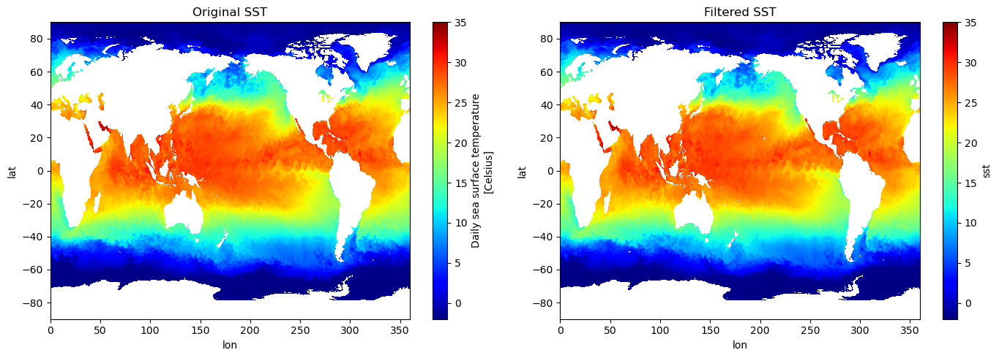

In [43]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sst_orig.plot(ax=axes[0], cmap="jet", vmin=-2, vmax=35)
axes[0].set_title('Original SST')

sst_filtered.plot(ax=axes[1], cmap="jet", vmin=-2, vmax=35)
axes[1].set_title('Filtered SST')

plt.tight_layout()
plt.show()

## Plot the Eddies (Original SST - Filtered SST)

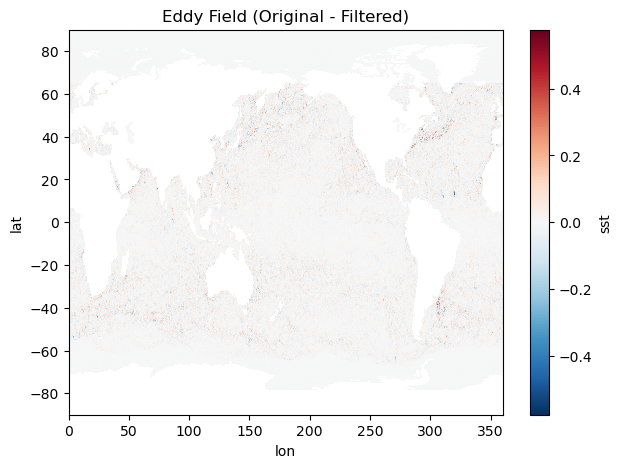

In [44]:
eddy_field = sst_orig - sst_filtered

plt.figure(figsize=(7, 5))
eddy_field.plot(cmap='RdBu_r', center=0)  # diverging colormap, center at 0
plt.title('Eddy Field (Original - Filtered)')
plt.show()